In [1]:
library(tidyverse)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


In [2]:
getwd()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2023_Zhu_et_al/Zhu_et_al_2023/24_09_24"

In [3]:
here::here()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2023_Zhu_et_al/Zhu_et_al_2023/24_09_24"

In [4]:
library(Seurat)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t




In [5]:
library(Signac)

In [6]:
library(Pando)


Attaching package: ‘Pando’


The following objects are masked from ‘package:Seurat’:

    GetAssay, VariableFeatures


The following objects are masked from ‘package:SeuratObject’:

    LayerData, VariableFeatures




In [7]:
list.files(here::here('R_Objects'))

[1] "endothelial_genes_subsetted.RDS"     
[2] "endothelial_genes.RDS"               
[3] "Zhu_et_al_Pando_w_eGRNs_SLURM_c1.RDS"
[4] "Zhu_et_al_Pando_w_eGRNs_SLURM_c2.RDS"
[5] "Zhu_et_al_Pando_w_eGRNs_SLURM_c3.RDS"
[6] "Zhu_et_al_Pando_w_eGRNs_SLURM_c4.RDS"
[7] "Zhu_et_al_Pando_w_eGRNs_SLURM_c5.RDS"
[8] "Zhu_et_al_Pando_w_eGRNs_SLURM_c6.RDS"
[9] "Zhu_et_al_Pando_w_motifs.RDS"

In [8]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c1 <- 
    readRDS(here::here('R_Objects', 'Zhu_et_al_Pando_w_eGRNs_SLURM_c1.RDS'))

In [9]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c2 <- 
    readRDS(here::here('R_Objects', 'Zhu_et_al_Pando_w_eGRNs_SLURM_c2.RDS'))

In [10]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c3 <- 
    readRDS(here::here('R_Objects', 'Zhu_et_al_Pando_w_eGRNs_SLURM_c3.RDS'))

In [11]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c4 <- 
    readRDS(here::here('R_Objects', 'Zhu_et_al_Pando_w_eGRNs_SLURM_c4.RDS'))

In [12]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c5 <- 
    readRDS(here::here('R_Objects', 'Zhu_et_al_Pando_w_eGRNs_SLURM_c5.RDS'))

In [13]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c6 <- 
    readRDS(here::here('R_Objects', 'Zhu_et_al_Pando_w_eGRNs_SLURM_c6.RDS'))

These imported network objects contain some overlapping genes. In the chunking command,\
I made sure that each following chunk contain some target genes from the previous chunk\
to later examine if there is any chunk wise variation on the inferred networks for the\
same target genes. Below, I extract those gene names and remove them from teh each following\
chunk that contains these genes. By this, I make sure that the concatanated final network \
contains non-duplicate target genes.

=========================================================

View the shared target genes between two consecutive networks:

In [15]:
intersect(coef(Zhu_et_al_Pando_w_eGRNs_SLURM_c1)$target, coef(Zhu_et_al_Pando_w_eGRNs_SLURM_c2)$target) %>% dput

c("AGAP1", "LRRFIP1", "SNED1")


In [16]:
intersect(coef(Zhu_et_al_Pando_w_eGRNs_SLURM_c2)$target, coef(Zhu_et_al_Pando_w_eGRNs_SLURM_c3)$target) %>% dput

c("DUSP1", "CPEB4")


In [17]:
intersect(coef(Zhu_et_al_Pando_w_eGRNs_SLURM_c3)$target, coef(Zhu_et_al_Pando_w_eGRNs_SLURM_c4)$target) %>% dput

c("NTRK2", "AGTPBP1")


In [18]:
intersect(coef(Zhu_et_al_Pando_w_eGRNs_SLURM_c4)$target, coef(Zhu_et_al_Pando_w_eGRNs_SLURM_c5)$target) %>% dput

c("STARD13", "NBEA", "DCLK1", "SMAD9", "LINC00571")


In [19]:
intersect(coef(Zhu_et_al_Pando_w_eGRNs_SLURM_c5)$target, coef(Zhu_et_al_Pando_w_eGRNs_SLURM_c6)$target) %>% dput

c("ZNF91", "URI1", "KIAA0355", "LSR")


In [20]:
# Assigne them to vectors:

C2_discard <- c("AGAP1", "LRRFIP1", "SNED1")

C3_discard <- c("DUSP1", "CPEB4")

C4_discard <- c("NTRK2", "AGTPBP1")

C5_discard <- c("STARD13", "NBEA", "DCLK1", "SMAD9", "LINC00571")

C6_discard <- c("ZNF91", "URI1", "KIAA0355", "LSR")

Above I assigned the shared genes to respective variables that are named to point out\
the network object from which they will be removed.

I will firstly filter out the overlapping genes from the coefficients table:

In [22]:
# Filter out these cells from the relevant network objects:

# I will remove the target genes from C2 object, those that are contained in the preceding C1 object.
# Similarly, genes will be removed form C3, that are contained already in C2 etc.

Zhu_et_al_Pando_w_eGRNs_SLURM_c2@grn@networks$glm_network@coefs <- 
    Zhu_et_al_Pando_w_eGRNs_SLURM_c2@grn@networks$glm_network@coefs %>% filter(!target %in% C2_discard)

In [23]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c3@grn@networks$glm_network@coefs <- 
    Zhu_et_al_Pando_w_eGRNs_SLURM_c3@grn@networks$glm_network@coefs %>% filter(!target %in% C3_discard)

In [24]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c4@grn@networks$glm_network@coefs <- 
    Zhu_et_al_Pando_w_eGRNs_SLURM_c4@grn@networks$glm_network@coefs %>% filter(!target %in% C4_discard)

In [25]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c5@grn@networks$glm_network@coefs <- 
    Zhu_et_al_Pando_w_eGRNs_SLURM_c5@grn@networks$glm_network@coefs %>% filter(!target %in% C5_discard)

In [26]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c6@grn@networks$glm_network@coefs <- 
    Zhu_et_al_Pando_w_eGRNs_SLURM_c6@grn@networks$glm_network@coefs %>% filter(!target %in% C6_discard)

Now, I will filter out the overlapping genes from the 'fit' dataframe.

Below, I firstly view the RSQ values and number of regressors used in the fitted models for those same genes\
in two consecutive modelling task:

In [27]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c2@grn@networks$glm_network@fit %>% filter(target %in% C2_discard)

target,rsq,nvariables
<chr>,<dbl>,<dbl>
AGAP1,0.27789392,1854
LRRFIP1,0.06130267,402
SNED1,0.19902664,1289


In [28]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c1@grn@networks$glm_network@fit %>% filter(target %in% C2_discard)

target,rsq,nvariables
<chr>,<dbl>,<dbl>
AGAP1,0.26026396,1648
LRRFIP1,0.06130267,402
SNED1,0.19902664,1289


In [29]:
# Except for AGAP1 genes, the other genes seem to possess same metrics for the two variables.

In [30]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c2@grn@networks$glm_network@fit %>% filter(target %in% C3_discard)

target,rsq,nvariables
<chr>,<dbl>,<dbl>
DUSP1,0.3074055,1488
CPEB4,0.1352515,1209


In [31]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c3@grn@networks$glm_network@fit %>% filter(target %in% C3_discard)

target,rsq,nvariables
<chr>,<dbl>,<dbl>
DUSP1,0.3507998,1781
CPEB4,0.1352515,1209


In [32]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c3@grn@networks$glm_network@fit %>% filter(target %in% C4_discard)

target,rsq,nvariables
<chr>,<dbl>,<dbl>
NTRK2,0.2461089,1111
AGTPBP1,0.1001443,624


In [33]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c4@grn@networks$glm_network@fit %>% filter(target %in% C4_discard)

target,rsq,nvariables
<chr>,<dbl>,<dbl>
NTRK2,0.2733882,1245
AGTPBP1,0.1001443,624


In [34]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c4@grn@networks$glm_network@fit %>% filter(target %in% C5_discard)

target,rsq,nvariables
<chr>,<dbl>,<dbl>
STARD13,0.12517295,1119
NBEA,0.23160203,1673
DCLK1,0.31077779,1489
SMAD9,0.01281562,77
LINC00571,0.00304030,37


In [35]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c5@grn@networks$glm_network@fit %>% filter(target %in% C5_discard)

target,rsq,nvariables
<chr>,<dbl>,<dbl>
STARD13,0.137102562,1327
NBEA,0.231602028,1673
DCLK1,0.310777792,1489
SMAD9,0.012815618,77
LINC00571,0.003035768,35


In [36]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c5@grn@networks$glm_network@fit %>% filter(target %in% C6_discard)

target,rsq,nvariables
<chr>,<dbl>,<dbl>
ZNF91,0.002772094,8
URI1,0.005853458,31
KIAA0355,0.023711285,287
LSR,0.181947474,527


In [37]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c6@grn@networks$glm_network@fit %>% filter(target %in% C6_discard)

target,rsq,nvariables
<chr>,<dbl>,<dbl>
ZNF91,0.002772094,8
URI1,0.005853458,31
KIAA0355,0.023711285,287
LSR,0.181947474,527


For almost all of them, both variables have same values in the respective consecutive network pairs.

======================

I filter out those shared genes also from the 'fit' tables:

In [38]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c2@grn@networks$glm_network@fit <- 
    Zhu_et_al_Pando_w_eGRNs_SLURM_c2@grn@networks$glm_network@fit %>% filter(!target %in% C2_discard)

In [40]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c3@grn@networks$glm_network@fit <- 
    Zhu_et_al_Pando_w_eGRNs_SLURM_c3@grn@networks$glm_network@fit %>% filter(!target %in% C3_discard)

In [41]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c4@grn@networks$glm_network@fit <- 
    Zhu_et_al_Pando_w_eGRNs_SLURM_c4@grn@networks$glm_network@fit %>% filter(!target %in% C4_discard)

In [42]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c5@grn@networks$glm_network@fit <- 
    Zhu_et_al_Pando_w_eGRNs_SLURM_c5@grn@networks$glm_network@fit %>% filter(!target %in% C5_discard)

In [43]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c6@grn@networks$glm_network@fit <- 
    Zhu_et_al_Pando_w_eGRNs_SLURM_c6@grn@networks$glm_network@fit %>% filter(!target %in% C6_discard)

In [44]:
# Join the networks:

Zhu_et_al_eGRNs_ALL <- Zhu_et_al_Pando_w_eGRNs_SLURM_c1

In [45]:
# Add the combined fit tables:

Zhu_et_al_eGRNs_ALL@grn@networks$glm_network@fit <- 
        rbind(Zhu_et_al_Pando_w_eGRNs_SLURM_c1@grn@networks$glm_network@fit,
              Zhu_et_al_Pando_w_eGRNs_SLURM_c2@grn@networks$glm_network@fit,
              Zhu_et_al_Pando_w_eGRNs_SLURM_c3@grn@networks$glm_network@fit,
              Zhu_et_al_Pando_w_eGRNs_SLURM_c4@grn@networks$glm_network@fit,
              Zhu_et_al_Pando_w_eGRNs_SLURM_c5@grn@networks$glm_network@fit,
              Zhu_et_al_Pando_w_eGRNs_SLURM_c6@grn@networks$glm_network@fit)

In [46]:
# Add the joined coefficient tables:

Zhu_et_al_eGRNs_ALL@grn@networks$glm_network@coefs <- 
        rbind(Zhu_et_al_Pando_w_eGRNs_SLURM_c1@grn@networks$glm_network@coefs,
              Zhu_et_al_Pando_w_eGRNs_SLURM_c2@grn@networks$glm_network@coefs,
              Zhu_et_al_Pando_w_eGRNs_SLURM_c3@grn@networks$glm_network@coefs,
              Zhu_et_al_Pando_w_eGRNs_SLURM_c4@grn@networks$glm_network@coefs,
              Zhu_et_al_Pando_w_eGRNs_SLURM_c5@grn@networks$glm_network@coefs,
              Zhu_et_al_Pando_w_eGRNs_SLURM_c6@grn@networks$glm_network@coefs)

In [47]:
Zhu_et_al_eGRNs_ALL

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1014 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
364381 features across 45549 samples within 3 assays 
Active assay: SCT (30146 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, peaks
 7 dimensional reductions calculated: pca, umap.rna, lsi, umap.atac, wnn.umap, pca.harmony, lsi.harmony


In [48]:
Zhu_et_al_eGRNs_ALL@grn

A RegulatoryNetwork object based on 1014 transcription factors

1 inferred network: glm_network

In [49]:
Zhu_et_al_eGRNs_ALL@grn@networks

$glm_network
A Network object
with 458 TFs and 2040 target genes

In [51]:
Zhu_et_al_eGRNs_ALL@grn@networks$glm_network@coefs %>% dim

[1] 919602     10

In [52]:
Zhu_et_al_eGRNs_ALL@grn@networks$glm_network@fit %>% dim

[1] 2040    3

In [60]:
Zhu_et_al_eGRNs_ALL@grn@networks$glm_network@features %>% head

CCNL2     GNB1      SKI   CAMTA1     PER3     RERE 
 "CCNL2"   "GNB1"    "SKI" "CAMTA1"   "PER3"   "RERE"

In [61]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c1@grn@networks$glm_network@features %>% length

[1] 481

In [62]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c2@grn@networks$glm_network@features %>% length

[1] 473

In [63]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c3@grn@networks$glm_network@features %>% length

[1] 480

In [64]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c4@grn@networks$glm_network@features %>% length

[1] 480

In [65]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c5@grn@networks$glm_network@features %>% length

[1] 483

In [66]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c6@grn@networks$glm_network@features %>% length

[1] 226

In [67]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c1@grn@networks$glm_network@features %>% head

CCNL2     GNB1      SKI   CAMTA1     PER3     RERE 
 "CCNL2"   "GNB1"    "SKI" "CAMTA1"   "PER3"   "RERE"

In [68]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c1@grn@networks$glm_network@fit$target %>% head

[1] "GNB1"   "SKI"    "CAMTA1" "PER3"   "RERE"   "UBE4B"

In [69]:
Zhu_et_al_Pando_w_eGRNs_SLURM_c1@grn@networks$glm_network@fit$target %>% length

[1] 381

In [75]:
NetworkFeatures(Zhu_et_al_eGRNs_ALL) %>% length

[1] 481

In [79]:
combined_features <- 
                        c(NetworkFeatures(Zhu_et_al_Pando_w_eGRNs_SLURM_c1), 
                        NetworkFeatures(Zhu_et_al_Pando_w_eGRNs_SLURM_c2),
                        NetworkFeatures(Zhu_et_al_Pando_w_eGRNs_SLURM_c3),
                        NetworkFeatures(Zhu_et_al_Pando_w_eGRNs_SLURM_c4), 
                        NetworkFeatures(Zhu_et_al_Pando_w_eGRNs_SLURM_c5), 
                        NetworkFeatures(Zhu_et_al_Pando_w_eGRNs_SLURM_c6))  

In [80]:
combined_features %>% length

[1] 2623

In [82]:
combined_features <- combined_features[!duplicated(combined_features)]

In [83]:
combined_features %>% length

[1] 2599

Out of 2712 genes, Pando selected 2533 genes for processing and could fit\
model for 2599 genes for the Zhu et al. 2023 dataset.

In [84]:
combined_features %>% head

CCNL2     GNB1      SKI   CAMTA1     PER3     RERE 
 "CCNL2"   "GNB1"    "SKI" "CAMTA1"   "PER3"   "RERE"

In [85]:
combined_features %>% tail

MT-CO2   MT-ATP6    MT-CO3    MT-ND3    MT-ND4    MT-CYB 
 "MT-CO2" "MT-ATP6"  "MT-CO3"  "MT-ND3"  "MT-ND4"  "MT-CYB"

In [86]:
Zhu_et_al_eGRNs_ALL@grn@networks$glm_network@features <- combined_features

In [87]:
# Adjust the pvalues again:

Zhu_et_al_eGRNs_ALL@grn@networks$glm_network@coefs %>% head

tf,target,region,term,estimate,std_err,statistic,pval,padj,corr
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
RFX4,GNB1,chr1-1069169-1069516,chr1_1069169_1069516:RFX4,0.002224200,0.010695012,0.2079661,8.352564e-01,9.439706e-01,-0.1145901
RFX4,GNB1,chr1-1135383-1135733,RFX4:chr1_1135383_1135733,0.002646025,0.010856960,0.2437170,8.074511e-01,9.325265e-01,-0.1145901
RFX4,GNB1,chr1-1615185-1615414,RFX4:chr1_1615185_1615414,-0.042369781,0.007459477,-5.6799934,1.355189e-08,6.441335e-07,-0.1145901
RFX4,GNB1,chr1-1983138-1983471,RFX4:chr1_1983138_1983471,-0.012787459,0.009194506,-1.3907717,1.643015e-01,4.433402e-01,-0.1145901
RFX4,GNB1,chr1-2128345-2128667,RFX4:chr1_2128345_2128667,-0.011523706,0.010665820,-1.0804332,2.799551e-01,5.895688e-01,-0.1145901
RFX4,GNB1,chr1-2322139-2322505,RFX4:chr1_2322139_2322505,-0.027938517,0.005392927,-5.1805852,2.221314e-07,8.151853e-06,-0.1145901


In [91]:
new_padj <- 
    p.adjust(p = Zhu_et_al_eGRNs_ALL@grn@networks$glm_network@coefs$pval, method = 'fdr')

In [92]:
old_padj <- Zhu_et_al_eGRNs_ALL@grn@networks$glm_network@coefs$padj

In [93]:
Zhu_et_al_eGRNs_ALL@grn@networks$glm_network@coefs$padj <- new_padj

In [94]:
Zhu_et_al_eGRNs_ALL@grn@networks$glm_network@coefs$old_padj <- old_padj

In [96]:
coef(Zhu_et_al_eGRNs_ALL) %>% count(padj < 0.1)

padj < 0.1,n
<lgl>,<int>
FALSE,774843
TRUE,144759


In [97]:
coef(Zhu_et_al_eGRNs_ALL) %>% count(old_padj < 0.1)

old_padj < 0.1,n
<lgl>,<int>
FALSE,774160
TRUE,145442


In [98]:
# There is a very slight decrease in the number of connections with padj < 0.1.

In [99]:
coef(Zhu_et_al_eGRNs_ALL) %>% count(padj < 0.05)

padj < 0.05,n
<lgl>,<int>
FALSE,807518
TRUE,112084


In [100]:
coef(Zhu_et_al_eGRNs_ALL) %>% count(old_padj < 0.05)

old_padj < 0.05,n
<lgl>,<int>
FALSE,806955
TRUE,112647


In [101]:
Zhu_et_al_eGRNs_ALL %>% 
    saveRDS(here::here('R_Objects', 'Zhu_et_al_eGRNs_combined.RDS'))

In [103]:
ls() %>% dput

c("C2_discard", "C3_discard", "C4_discard", "C5_discard", "C6_discard", 
"combined_features", "new_p_adj", "new_padj", "old_padj", "Zhu_et_al_eGRNs_ALL", 
"Zhu_et_al_Pando_w_eGRNs_SLURM_c1", "Zhu_et_al_Pando_w_eGRNs_SLURM_c2", 
"Zhu_et_al_Pando_w_eGRNs_SLURM_c3", "Zhu_et_al_Pando_w_eGRNs_SLURM_c4", 
"Zhu_et_al_Pando_w_eGRNs_SLURM_c5", "Zhu_et_al_Pando_w_eGRNs_SLURM_c6"
)


In [104]:
rm(list = c("C2_discard", "C3_discard", "C4_discard", "C5_discard", "C6_discard", 
"combined_features", "new_p_adj", "new_padj", "old_padj", 
"Zhu_et_al_Pando_w_eGRNs_SLURM_c1", "Zhu_et_al_Pando_w_eGRNs_SLURM_c2", 
"Zhu_et_al_Pando_w_eGRNs_SLURM_c3", "Zhu_et_al_Pando_w_eGRNs_SLURM_c4", 
"Zhu_et_al_Pando_w_eGRNs_SLURM_c5", "Zhu_et_al_Pando_w_eGRNs_SLURM_c6"
))

In [105]:
ls()

[1] "Zhu_et_al_eGRNs_ALL"

In [106]:
global_eGRN_copy <- Zhu_et_al_eGRNs_ALL

In [107]:
Zhu_et_al_eGRNs_ALL  <- find_modules(
    Zhu_et_al_eGRNs_ALL, 
    p_thresh = 0.1,
    nvar_thresh = 2, 
    min_genes_per_module = 1, 
    rsq_thresh = 0.05
)

Found 446 TF modules



In [108]:
# Import network visualization functions:

source(here::here('network_visualization_functions.r'))

Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


‘network’ 1.18.2 (2023-12-04), part of the Statnet Project
* ‘news(package="network")’ for changes since last version
* ‘citation("network")’ for citation information
* ‘https://statnet.org’ for help, support, and other information



Attaching package: ‘igraph’


The following objects are masked from ‘package:network’:

    %c%, %s%, add.edges, add.vertices, delete.edges, delete.vertices,
    get.edge.attribute, get.edges, get.vertex.attribute, is.bipartite,
    is.directed, list.edge.attributes, list.vertex.attributes,
    set.edge.attribute, set.vertex.attribute


The following object is masked from ‘package:Seurat’:

    components


The following objects are masked from ‘package:lubridate’:

    %--%, union


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following objects are masked from ‘package:purrr’:

    compose, simplify


The following object is

In [109]:
options(repr.plot.width = 30, repr.plot.height = 24)

 Network attributes:
  vertices = 1435 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 45711 
    missing edges= 0 
    non-missing edges= 45711 

 Vertex attribute names: 
    vertex.names 

 Edge attribute names not shown 


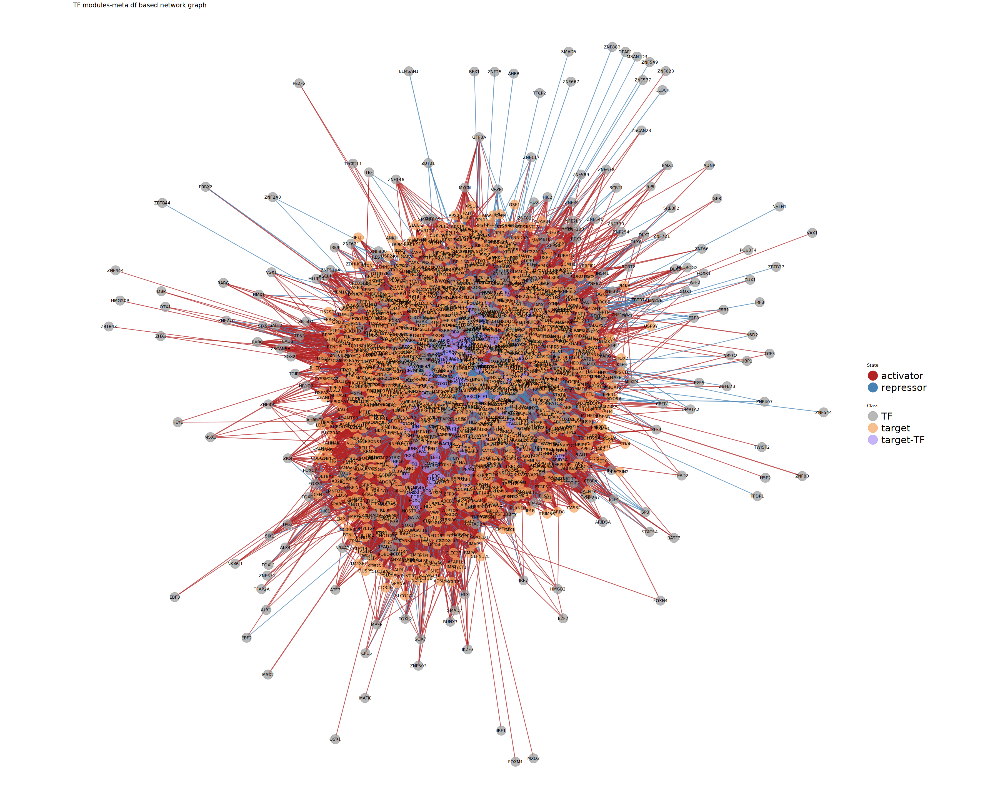

In [110]:
vis_network_w_GGNET2(meta_DF = NetworkModules(Zhu_et_al_eGRNs_ALL)@meta)

In [112]:
Zhu_et_al_seurat <- Zhu_et_al_eGRNs_ALL@data

In [113]:
Zhu_et_al_seurat %>% levels

[1] "0"  "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14"
[16] "15" "16" "17" "18" "19" "20" "21" "22"

In [114]:
Idents(Zhu_et_al_seurat) <- 'cell_type'

In [115]:
Zhu_et_al_seurat %>% levels

[1] "endothelial cell"                              
 [2] "astrocyte"                                     
 [3] "oligodendrocyte"                               
 [4] "microglial cell"                               
 [5] "vascular associated smooth muscle cell"        
 [6] "inhibitory interneuron"                        
 [7] "pericyte"                                      
 [8] "glutamatergic neuron"                          
 [9] "radial glial cell"                             
[10] "oligodendrocyte precursor cell"                
[11] "neural progenitor cell"                        
[12] "medial ganglionic eminence derived interneuron"
[13] "caudal ganglionic eminence derived interneuron"

In [116]:
Zhu_et_al_seurat

An object of class Seurat 
364381 features across 45549 samples within 3 assays 
Active assay: SCT (30146 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, peaks
 7 dimensional reductions calculated: pca, umap.rna, lsi, umap.atac, wnn.umap, pca.harmony, lsi.harmony

In [117]:
EC_detected_peaks_min5 <- 
    AccessiblePeaks(object = Zhu_et_al_seurat, assay = 'peaks', idents = 'endothelial cell', min.cells = 5)

In [118]:
EC_detected_peaks_min5 %>% length

[1] 46362

In [119]:
EC_detected_peaks_min1 <- 
    AccessiblePeaks(object = Zhu_et_al_seurat, assay = 'peaks', idents = 'endothelial cell', min.cells = 1)

In [120]:
EC_detected_peaks_min1 %>% length

[1] 144345

In [121]:
EC_eGRN_min5 <- global_eGRN_copy

In [122]:
EC_eGRN_min5@grn@networks$glm_network@coefs <- 
                EC_eGRN_min5@grn@networks$glm_network@coefs %>% 
                            filter(region %in% EC_detected_peaks_min5)

In [123]:
coef(EC_eGRN_min5) %>% dim

[1] 2108   11

In [124]:
EC_eGRN_min5  <- find_modules(
    EC_eGRN_min5, 
    p_thresh = 0.1,
    nvar_thresh = 2, 
    min_genes_per_module = 1, 
    rsq_thresh = 0.05
)

Found 150 TF modules



 Network attributes:
  vertices = 297 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 339 
    missing edges= 0 
    non-missing edges= 339 

 Vertex attribute names: 
    vertex.names 

No edge attributes


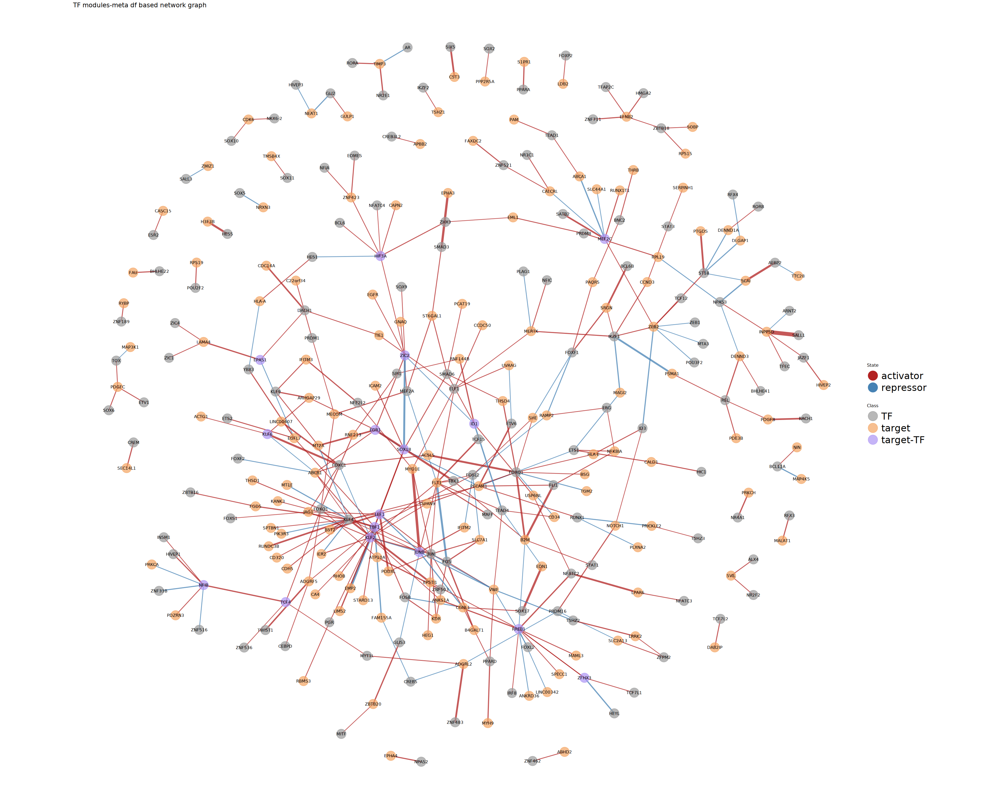

In [125]:
vis_network_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min5)@meta)

In [126]:
options(repr.plot.width = 15, repr.plot.height = 7)

Warning message:
“Using alpha for a discrete variable is not advised.”


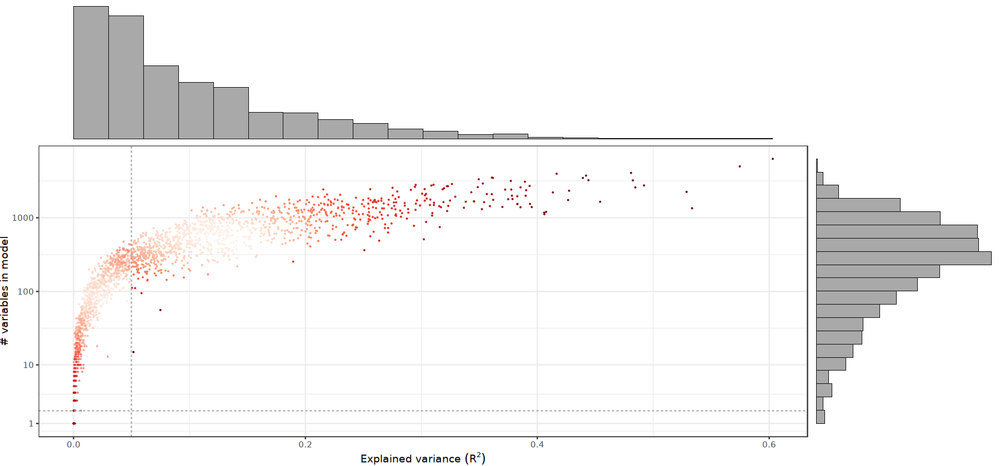

In [127]:
plot_gof(object = EC_eGRN_min5) # Check the goodness of fit plot for the inferred network.

In [128]:
EC_eGRN_min1 <- global_eGRN_copy

In [129]:
EC_eGRN_min1@grn@networks$glm_network@coefs <- 
                EC_eGRN_min1@grn@networks$glm_network@coefs %>% 
                            filter(region %in% EC_detected_peaks_min1)

In [130]:
coef(EC_eGRN_min1) %>% dim

[1] 11159    11

In [132]:
EC_eGRN_min1  <- find_modules(
    EC_eGRN_min1, 
    p_thresh = 0.1,
    nvar_thresh = 2, 
    min_genes_per_module = 1, 
    rsq_thresh = 0.05
)

Found 250 TF modules



Warning message:
“Using alpha for a discrete variable is not advised.”


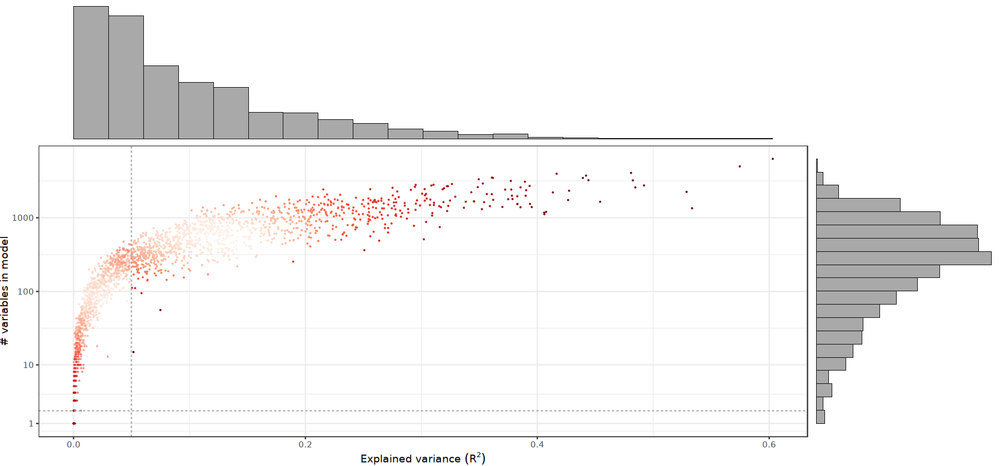

In [133]:
plot_gof(object = EC_eGRN_min1) # Check the goodness of fit plot for the inferred network.

In [134]:
options(repr.plot.width = 30, repr.plot.height = 24)

 Network attributes:
  vertices = 705 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 1210 
    missing edges= 0 
    non-missing edges= 1210 

 Vertex attribute names: 
    vertex.names 

 Edge attribute names not shown 


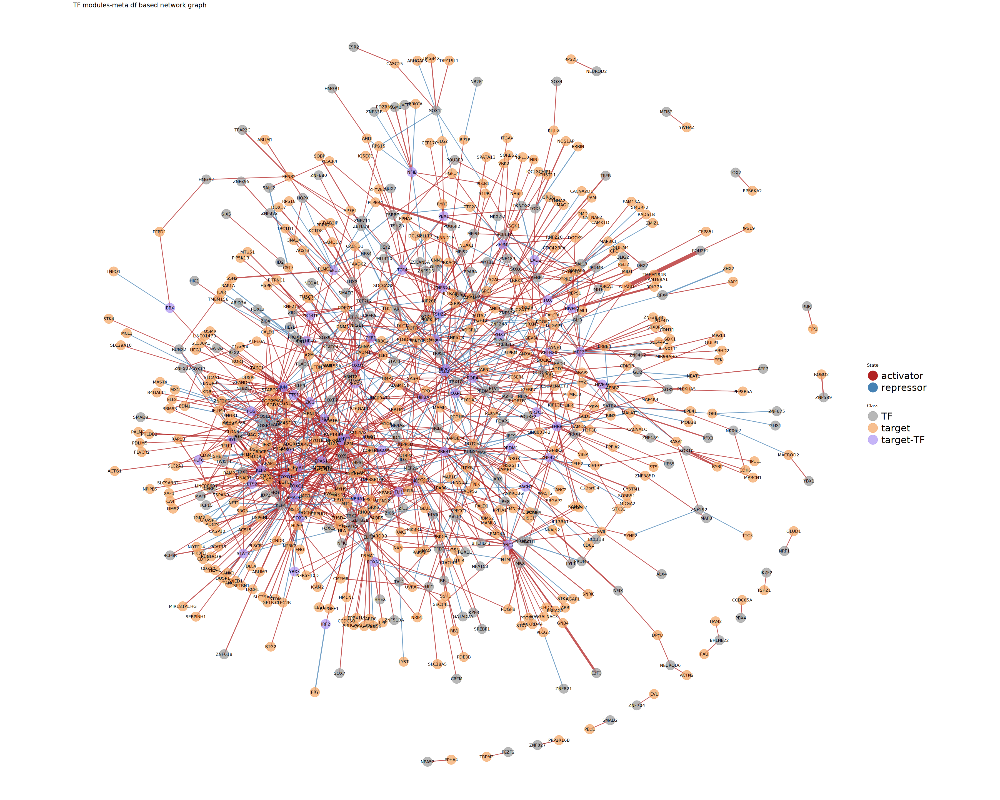

In [135]:
vis_network_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min1)@meta)

In [136]:
G_Bonilla_et_al_DE_data_sig_EC <- readRDS(here::here('R_Objects', 'DE_data_sig_EC.RDS'))

In [137]:
net_data_EC_min5 <- NetworkModules(EC_eGRN_min5)@meta %>% 
                        select(gene_name = target, feature = tf, weight = estimate)

In [138]:
# Run GRaNPA to generate the RF models:

res_EC_min5 <- GRaNPA::GRaNPA_Analysis(gene_metric_data = G_Bonilla_et_al_DE_data_sig_EC, 
                                       GRN_matrix = net_data_EC_min5)

Loading required package: futile.logger

Loading required package: caret

Loading required package: lattice


Attaching package: ‘caret’


The following object is masked from ‘package:purrr’:

    lift




INFO [2024-10-01 17:53:08] GRaNPA version 2, predicting gene-specific values based on network data and reporting important transcription factors that can explain variations. Ensure input data is pre-filtered.
INFO [2024-10-01 17:53:08] Start of applying learning model
INFO [2024-10-01 17:53:08] number of features: 66
INFO [2024-10-01 17:53:08] number of Genes: 48
INFO [2024-10-01 17:53:11] Start of applying learning model
INFO [2024-10-01 17:53:11] number of features: 66
INFO [2024-10-01 17:53:11] number of Genes: 48


In [139]:
net_data_EC_min1 <- NetworkModules(EC_eGRN_min1)@meta %>% 
                        select(gene_name = target, feature = tf, weight = estimate)

In [140]:
# Run GRaNPA to generate the RF models:

res_EC_min1 <- GRaNPA::GRaNPA_Analysis(gene_metric_data = G_Bonilla_et_al_DE_data_sig_EC, 
                                       GRN_matrix = net_data_EC_min1)

INFO [2024-10-01 17:53:56] GRaNPA version 2, predicting gene-specific values based on network data and reporting important transcription factors that can explain variations. Ensure input data is pre-filtered.
INFO [2024-10-01 17:53:56] Start of applying learning model
INFO [2024-10-01 17:53:56] number of features: 128
INFO [2024-10-01 17:53:56] number of Genes: 115
INFO [2024-10-01 17:54:06] Start of applying learning model
INFO [2024-10-01 17:54:06] number of features: 128
INFO [2024-10-01 17:54:06] number of Genes: 115


In [141]:
p1 <- GRaNPA::plot_GRaNPA_result(res = res_EC_min5$result) + 
                                ggtitle(label = 'accessible_regions_min_5_cells')

Loading required package: cowplot


Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp




In [142]:
p1.2 <- GRaNPA::plot_important_features(model = res_EC_min5$models$Real, n = 20) +
                                ggtitle(label = 'accessible_regions_min_5_cells')

In [148]:
options(repr.plot.width = 10, repr.plot.height = 10)

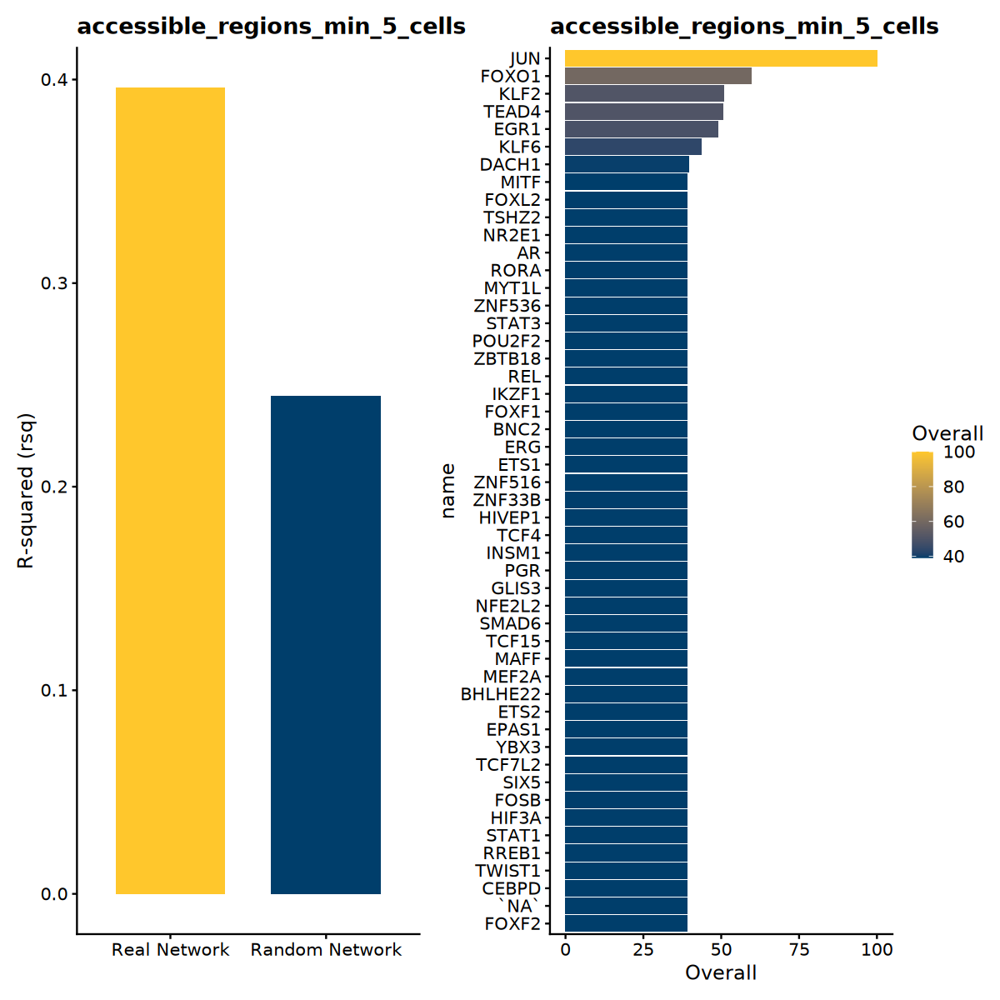

In [149]:
p1 + p1.2

In [151]:
p1.2$data

,Overall,name
,<dbl>,<fct>
FOXF2,39.01207,FOXF2
`NA`,39.01207,`NA`
CEBPD,39.01207,CEBPD
TWIST1,39.01207,TWIST1
RREB1,39.01207,RREB1
STAT1,39.01207,STAT1
HIF3A,39.01207,HIF3A
FOSB,39.01207,FOSB
SIX5,39.01207,SIX5


In [152]:
p2 <- GRaNPA::plot_GRaNPA_result(res = res_EC_min1$result) + 
                                ggtitle(label = 'accessible_regions_min_1_cells')

In [153]:
p2.2 <- GRaNPA::plot_important_features(model = res_EC_min1$models$Real, n = 20) +
                                ggtitle(label = 'accessible_regions_min_1_cells')

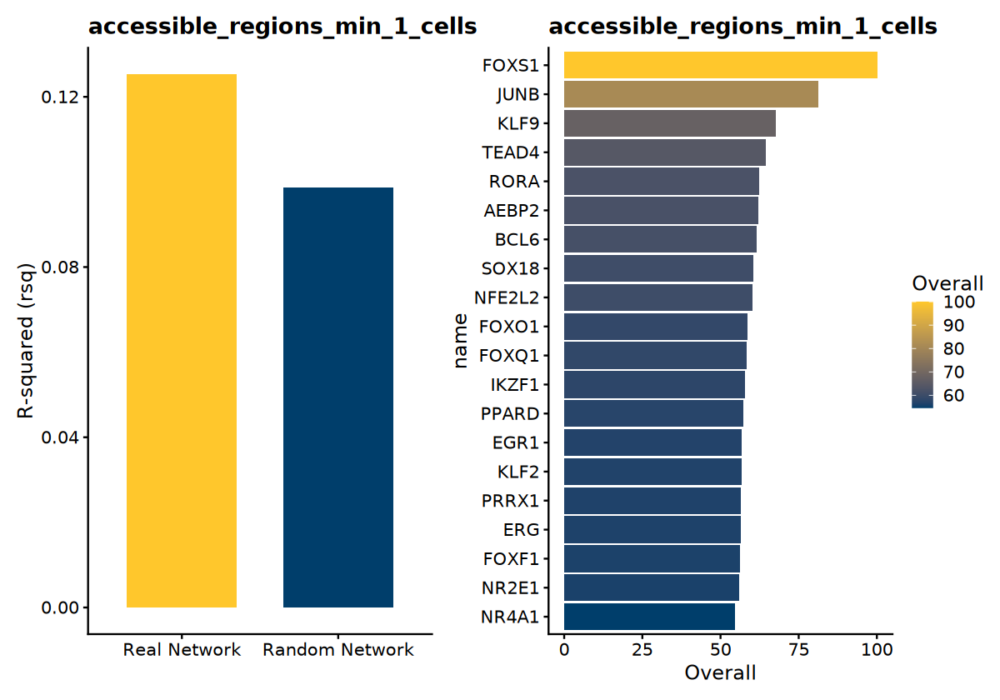

In [155]:
options(repr.plot.width = 10, repr.plot.height = 7)

p2 + p2.2

In [157]:
important_TFs_EC_min5 <- p1.2$data %>% arrange(desc(Overall))

In [158]:
important_TFs_EC_min1 <- p2.2$data %>% arrange(desc(Overall))

In [160]:
important_TFs_EC_min5 %>% print

          Overall    name
JUN     100.00000     JUN
FOXO1    59.61612   FOXO1
KLF2     50.82840    KLF2
TEAD4    50.42950   TEAD4
EGR1     48.97201    EGR1
KLF6     43.64499    KLF6
DACH1    39.47923   DACH1
FOXF2    39.01207   FOXF2
`NA`     39.01207    `NA`
CEBPD    39.01207   CEBPD
TWIST1   39.01207  TWIST1
RREB1    39.01207   RREB1
STAT1    39.01207   STAT1
HIF3A    39.01207   HIF3A
FOSB     39.01207    FOSB
SIX5     39.01207    SIX5
TCF7L2   39.01207  TCF7L2
YBX3     39.01207    YBX3
EPAS1    39.01207   EPAS1
ETS2     39.01207    ETS2
BHLHE22  39.01207 BHLHE22
MEF2A    39.01207   MEF2A
MAFF     39.01207    MAFF
TCF15    39.01207   TCF15
SMAD6    39.01207   SMAD6
NFE2L2   39.01207  NFE2L2
GLIS3    39.01207   GLIS3
PGR      39.01207     PGR
INSM1    39.01207   INSM1
TCF4     39.01207    TCF4
HIVEP1   39.01207  HIVEP1
ZNF33B   39.01207  ZNF33B
ZNF516   39.01207  ZNF516
ETS1     39.01207    ETS1
ERG      39.01207     ERG
BNC2     39.01207    BNC2
FOXF1    39.01207   FOXF1
IKZF1    39.

In [161]:
important_TFs_EC_min1 %>% print

         Overall   name
FOXS1  100.00000  FOXS1
JUNB    81.20568   JUNB
KLF9    67.49628   KLF9
TEAD4   64.27457  TEAD4
RORA    62.26839   RORA
AEBP2   61.93196  AEBP2
BCL6    61.41280   BCL6
SOX18   60.31124  SOX18
NFE2L2  60.19860 NFE2L2
FOXO1   58.54296  FOXO1
FOXQ1   58.33265  FOXQ1
IKZF1   57.81756  IKZF1
PPARD   57.27209  PPARD
EGR1    56.70714   EGR1
KLF2    56.52871   KLF2
PRRX1   56.35500  PRRX1
ERG     56.23337    ERG
FOXF1   56.13701  FOXF1
NR2E1   55.90765  NR2E1
NR4A1   54.58183  NR4A1


 Network attributes:
  vertices = 69 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 90 
    missing edges= 0 
    non-missing edges= 90 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


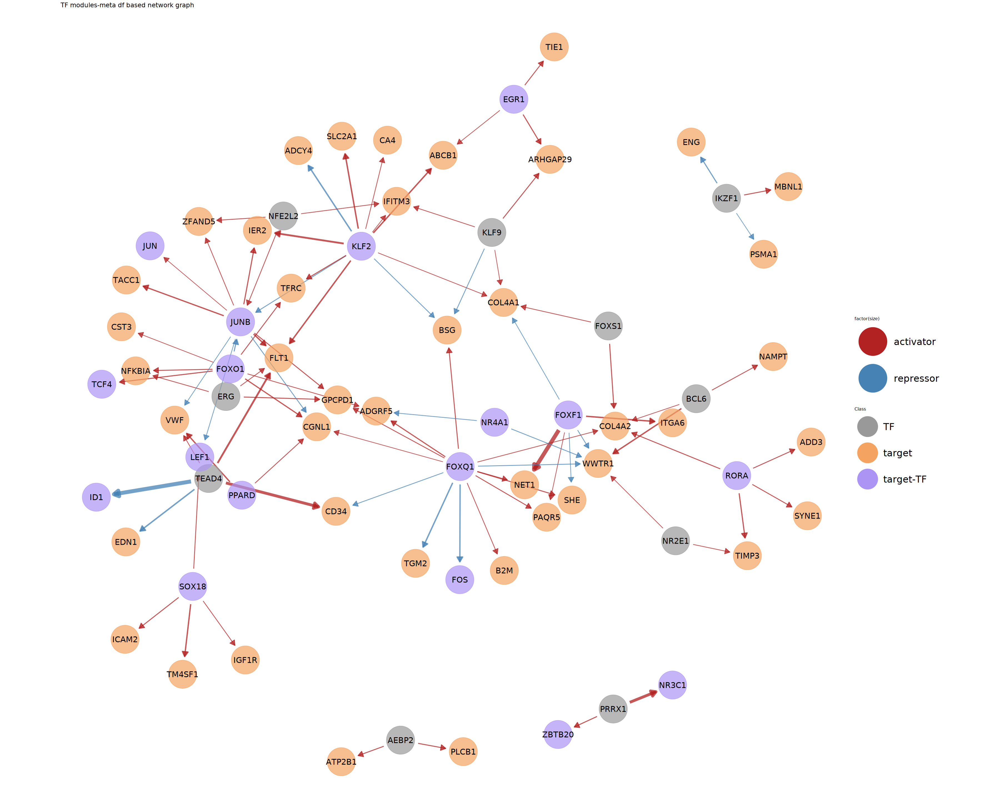

In [163]:
vis_network_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min1)@meta,
                         subnetwork_default_node_and_label_size =  TRUE,
                         target_genes = G_Bonilla_et_al_DE_data_sig_EC$gene_name, 
                         TF_names = as.character(important_TFs_EC_min1$name), 
                         arrow = TRUE) + 
            guides(colour = guide_legend(override.aes = list(size=20)))  # manually increase the class legend.

 Network attributes:
  vertices = 17 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 15 
    missing edges= 0 
    non-missing edges= 15 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


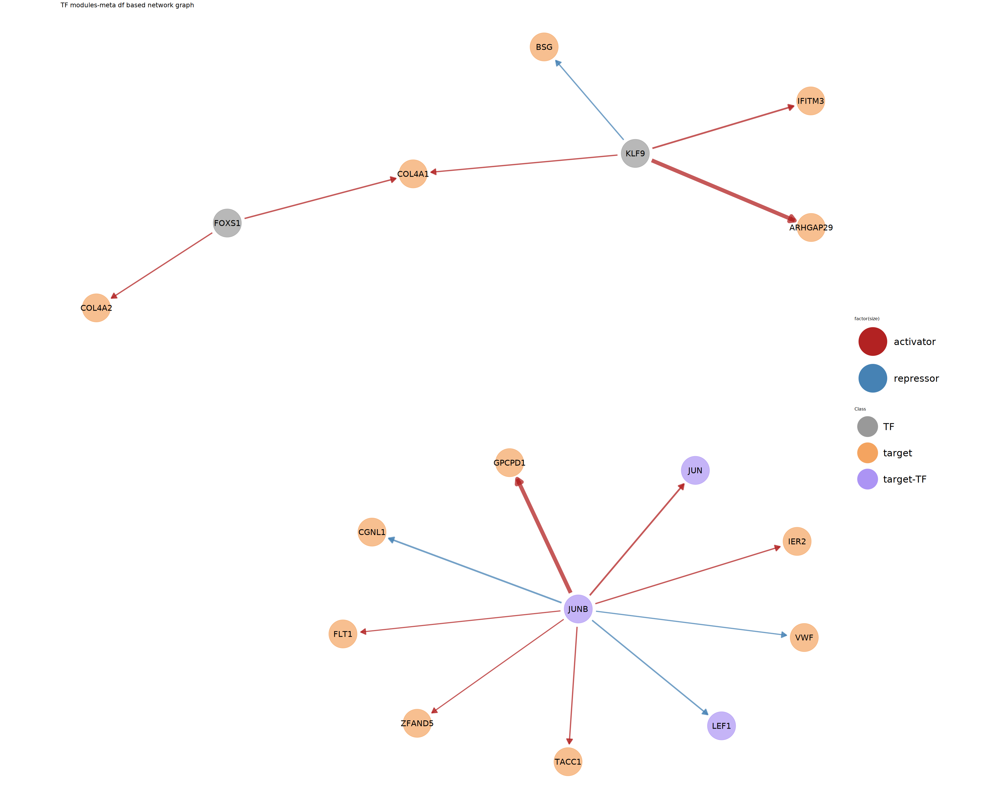

In [164]:
vis_network_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min1)@meta,
                         subnetwork_default_node_and_label_size =  TRUE,
                         target_genes = G_Bonilla_et_al_DE_data_sig_EC$gene_name, 
                         TF_names = as.character(important_TFs_EC_min1$name)[1:3], 
                         arrow = TRUE) + 
            guides(colour = guide_legend(override.aes = list(size=20)))  # manually increase the class legend.

 Network attributes:
  vertices = 3 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 2 
    missing edges= 0 
    non-missing edges= 2 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


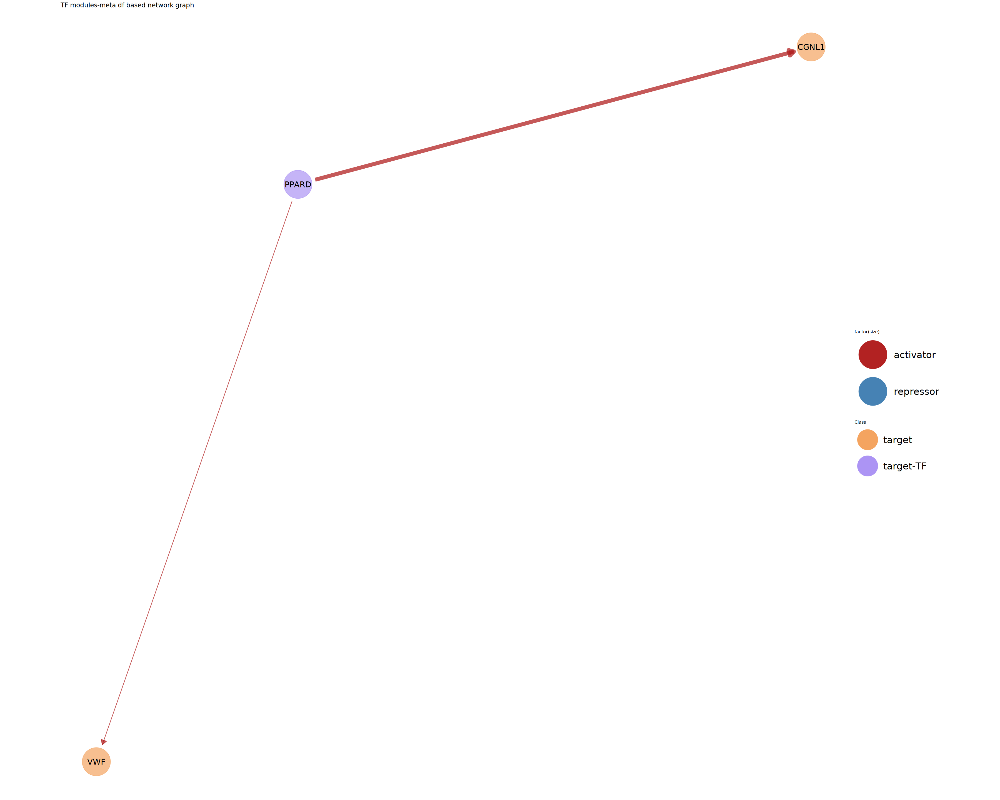

In [165]:
vis_network_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min1)@meta,
                         subnetwork_default_node_and_label_size =  TRUE,
                         target_genes = G_Bonilla_et_al_DE_data_sig_EC$gene_name, 
                         TF_names = 'PPARD', 
                         arrow = TRUE) + 
            guides(colour = guide_legend(override.aes = list(size=20)))  # manually increase the class legend.

IGRAPH f00d75f DNW- 17 15 -- 
+ attr: name (v/c), class (v/c), color (v/c), estimate (e/n), n_regions
| (e/n), n_genes (e/n), n_tfs (e/n), regions (e/c), pval (e/n), padj
| (e/n), weight (e/n), color (e/c)
+ edges from f00d75f (vertex names):
 [1] FOXS1->COL4A1   FOXS1->COL4A2   JUNB ->CGNL1    JUNB ->FLT1    
 [5] JUNB ->GPCPD1   JUNB ->IER2     JUNB ->JUN      JUNB ->LEF1    
 [9] JUNB ->TACC1    JUNB ->VWF      JUNB ->ZFAND5   KLF9 ->ARHGAP29
[13] KLF9 ->BSG      KLF9 ->COL4A1   KLF9 ->IFITM3  


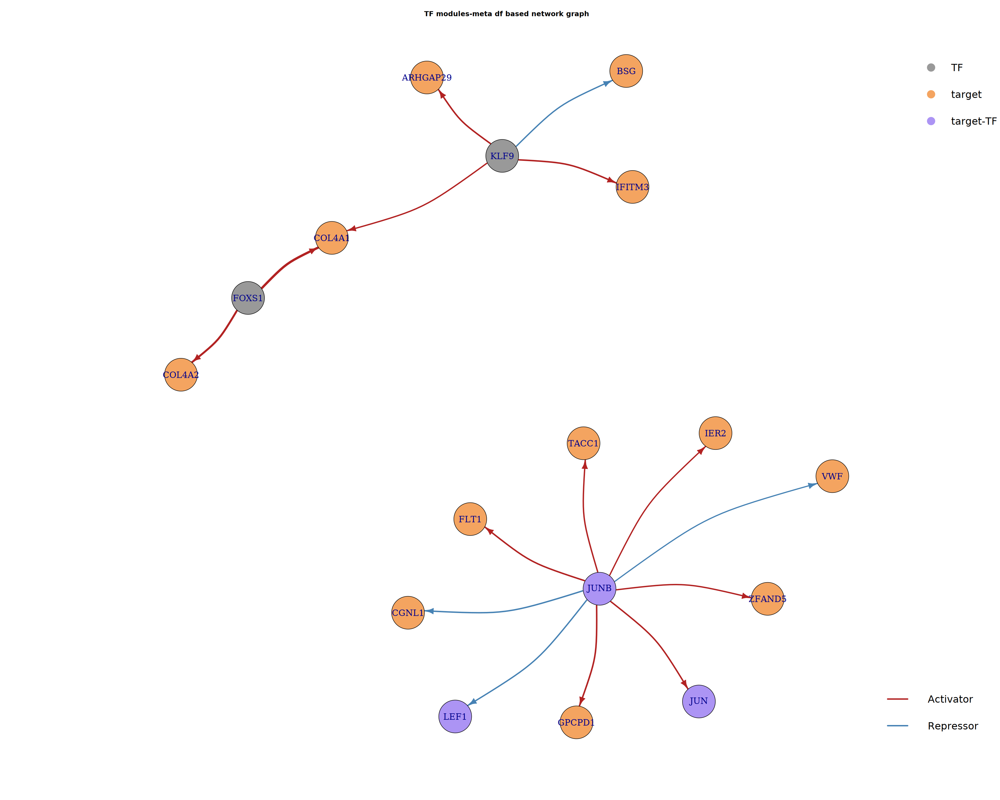

In [166]:
vis_network_IGRAPH(meta_DF = NetworkModules(EC_eGRN_min1)@meta,
                         target_genes = G_Bonilla_et_al_DE_data_sig_EC$gene_name, 
                         TF_names = as.character(important_TFs_EC_min1$name)[1:3], 
                         arrow = TRUE)

In [167]:
ls()

[1] "EC_detected_peaks_min1"                                         
 [2] "EC_detected_peaks_min5"                                         
 [3] "EC_eGRN_min1"                                                   
 [4] "EC_eGRN_min5"                                                   
 [5] "G_Bonilla_et_al_DE_data_sig_EC"                                 
 [6] "global_eGRN_copy"                                               
 [7] "important_TFs_EC_min1"                                          
 [8] "important_TFs_EC_min5"                                          
 [9] "net_data_EC_min1"                                               
[10] "net_data_EC_min5"                                               
[11] "p1"                                                             
[12] "p1.2"                                                           
[13] "p2"                                                             
[14] "p2.2"                                                           
[15] "res_EC_min1"                                                    
[16] "res_EC_min5"                                                    
[17] "vis_network_IGRAPH"                                             
[18] "vis_network_w_degree_based_subset_w_GGNET2"                     
[19] "vis_network_w_degree_thresholded_vertices_OLD_FUNCTION_w_GGNET2"
[20] "vis_network_w_GGNET2"                                           
[21] "vis_subnetwork_w_GGNET2"                                        
[22] "vis_subnetwork_w_GGRAPH"                                        
[23] "Zhu_et_al_eGRNs_ALL"                                            
[24] "Zhu_et_al_seurat"

In [168]:
EC_detected_peaks_min1 %>% 
    saveRDS(here::here('R_Objects', 'EC_detected_peaks_min1.RDS'))

In [169]:
EC_detected_peaks_min5 %>% 
    saveRDS(here::here('R_Objects', 'EC_detected_peaks_min5.RDS'))

In [170]:
important_TFs_EC_min1 %>% 
    saveRDS(here::here('R_Objects', 'important_TFs_EC_min1.RDS'))

In [171]:
important_TFs_EC_min5 %>% 
    saveRDS(here::here('R_Objects', 'important_TFs_EC_min5.RDS'))

In [172]:
sessionInfo()

R version 4.4.1 (2024-06-14)
Platform: x86_64-unknown-linux-gnu
Running under: Red Hat Enterprise Linux 9.4 (Plow)

Matrix products: default
BLAS/LAPACK: /gnu/store/mvbj21lcf387dgs04d29n0sxrydq03a6-openblas-0.3.20/lib/libopenblasp-r0.3.20.so;  LAPACK version 3.9.0

locale:
 [1] LC_CTYPE=en_GB.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_GB.UTF-8        LC_COLLATE=en_GB.UTF-8    
 [5] LC_MONETARY=en_GB.UTF-8    LC_MESSAGES=en_GB.UTF-8   
 [7] LC_PAPER=en_GB.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_GB.UTF-8 LC_IDENTIFICATION=C       

time zone: Europe/Berlin
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] cowplot_1.1.3       caret_6.0-94        lattice_0.22-6     
 [4] futile.logger_1.4.3 ggraph_2.2.1        igraph_2.0.3       
 [7] network_1.18.2      GGally_2.2.1        Pando_1.1.1     